In [3]:
# Copyright 2023 Shane Khalid. All Rights Reserved.
#
# Licensed under the Apache License, Version 2.0 (the "License");
# you may not use this file except in compliance with the License.
# You may obtain a copy of the License at
#
#     http://www.apache.org/licenses/LICENSE-2.0
#
# Unless required by applicable law or agreed to in writing, software
# distributed under the License is distributed on an "AS IS" BASIS,
# WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
# See the License for the specific language governing permissions and
# limitations under the License.
# ==============================================================================License.

# Stock Prediction Deep Learning Model

##### Stock/Asset prices are time-series data and so I am implementing a LSTM (Long Short-Term Memory) which is a type of RNN (Recurrent Neural Network) that can remember information over a long period of time. 

##### Import libraries. I normally use yfinance for this, but I have a clean dataset loading in

In [1]:
import numpy as np
import pandas as pd
import tensorflow as tf

import plotly.express as px
import statsmodels.api as sm
import matplotlib.pyplot as plt
import plotly.graph_objects as go

from tensorflow import keras

from keras.layers import GRU, Dropout, SimpleRNN, LSTM, Dense, SimpleRNN, GRU
from keras.models import Sequential
from sklearn.preprocessing import MinMaxScaler
print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))

2023-10-18 16:12:11.476119: E tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:9342] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2023-10-18 16:12:11.476178: E tensorflow/compiler/xla/stream_executor/cuda/cuda_fft.cc:609] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2023-10-18 16:12:11.477641: E tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:1518] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2023-10-18 16:12:11.610707: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


Num GPUs Available:  1


2023-10-18 16:12:15.660173: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:880] could not open file to read NUMA node: /sys/bus/pci/devices/0000:43:00.0/numa_node
Your kernel may have been built without NUMA support.
2023-10-18 16:12:15.687115: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:880] could not open file to read NUMA node: /sys/bus/pci/devices/0000:43:00.0/numa_node
Your kernel may have been built without NUMA support.
2023-10-18 16:12:15.687162: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:880] could not open file to read NUMA node: /sys/bus/pci/devices/0000:43:00.0/numa_node
Your kernel may have been built without NUMA support.


##### Load Data (Google stock)

In [2]:
google_training_complete = pd.read_csv("./Google_Stock_Train (2010-2022).csv")

# Convert 'Date' column to datetime format
google_training_complete['Date'] = pd.to_datetime(google_training_complete['Date'])

google_training_complete.head(10)

,Date,Open,High,Low,Close,Adj Close,Volume
0,2010-01-04,15.689439,15.753504,15.621622,15.684434,15.684434,78169752
1,2010-01-05,15.695195,15.711712,15.554054,15.615365,15.615365,120067812
2,2010-01-06,15.662162,15.662162,15.174174,15.221722,15.221722,158988852
3,2010-01-07,15.250250,15.265265,14.831081,14.867367,14.867367,256315428
4,2010-01-08,14.814815,15.096346,14.742492,15.065566,15.065566,188783028
5,2010-01-11,15.126627,15.126627,14.865866,15.042793,15.042793,288227484
6,2010-01-12,14.956206,14.968969,14.714715,14.776777,14.776777,193937868
7,2010-01-13,14.426677,14.724224,14.361862,14.691942,14.691942,259604136
8,2010-01-14,14.612112,14.869870,14.584835,14.761011,14.761011,169434396
9,2010-01-15,14.848348,14.853854,14.465465,14.514515,14.514515,217162620


## Exploratory Data Analysis (EDA)

/home/shane/.local/lib/python3.10/site-packages/_plotly_utils/basevalidators.py:105: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  v = v.dt.to_pydatetime()


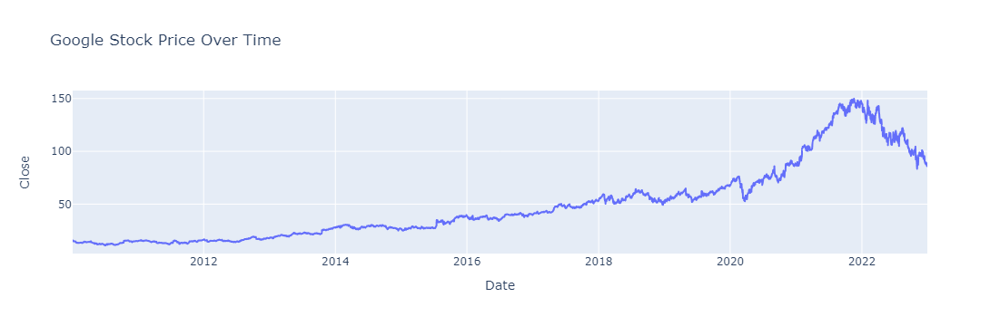

In [3]:
# Line chart for Google stock price over time
fig1 = px.line(google_training_complete, x='Date', y='Close', title='Google Stock Price Over Time')
fig1.show()

/home/shane/.local/lib/python3.10/site-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



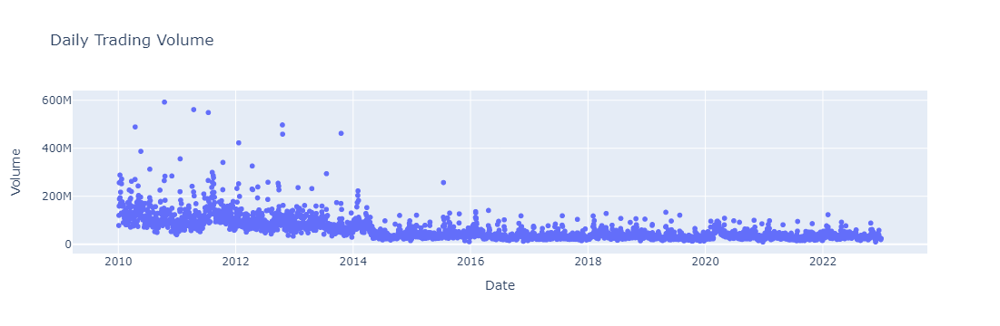

In [4]:
# Scatter plot of daily trading volume
fig2 = px.scatter(google_training_complete, x='Date', y='Volume', title='Daily Trading Volume')
fig2.show()

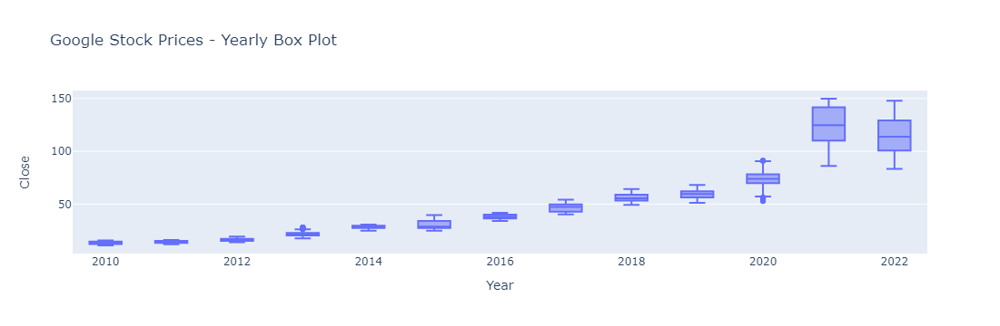

In [5]:
# Box plot of Google stock prices for each year
google_training_complete['Year'] = google_training_complete['Date'].dt.year
fig3 = px.box(google_training_complete, x='Year', y='Close', title='Google Stock Prices - Yearly Box Plot')
fig3.show()

/home/shane/.local/lib/python3.10/site-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



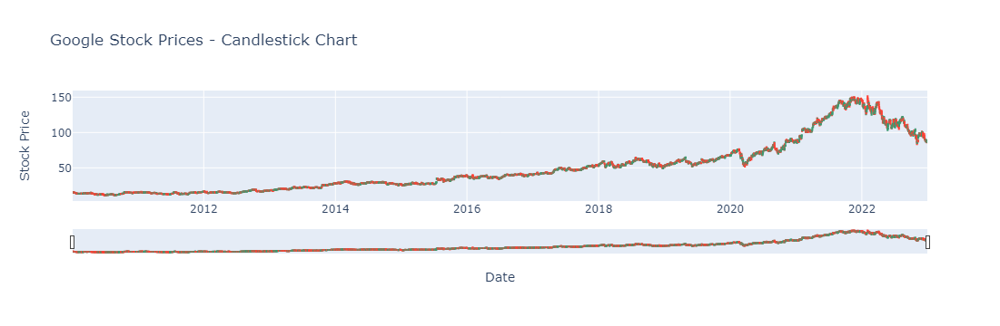

In [6]:
# Candlestick chart for stock prices
fig4 = go.Figure(data=[go.Candlestick(x=google_training_complete['Date'],
                                     open=google_training_complete['Open'],
                                     high=google_training_complete['High'],
                                     low=google_training_complete['Low'],
                                     close=google_training_complete['Close'])])

fig4.update_layout(title='Google Stock Prices - Candlestick Chart',
                   xaxis_title='Date',
                   yaxis_title='Stock Price')

fig4.show()

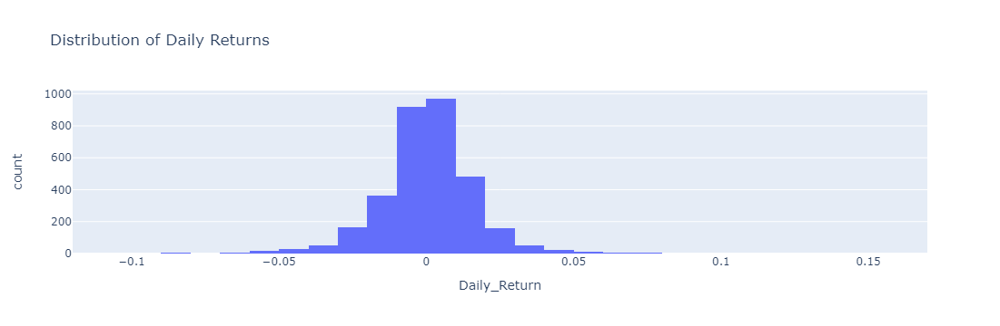

In [7]:
# Histogram of daily returns
google_training_complete['Daily_Return'] = google_training_complete['Close'].pct_change()
fig5 = px.histogram(google_training_complete, x='Daily_Return', nbins=30, title='Distribution of Daily Returns')
fig5.show()

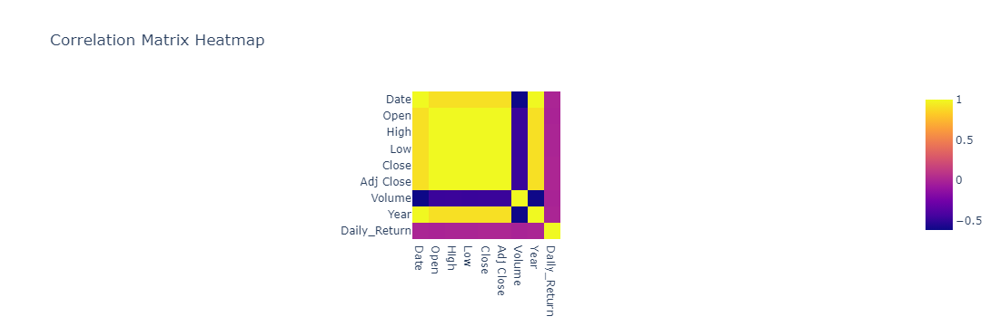

In [9]:
# Heatmap of correlation matrix
correlation_matrix = google_training_complete.corr()
fig6 = px.imshow(correlation_matrix, x=correlation_matrix.index, y=correlation_matrix.columns, title='Correlation Matrix Heatmap')
fig6.show()

/home/shane/.local/lib/python3.10/site-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



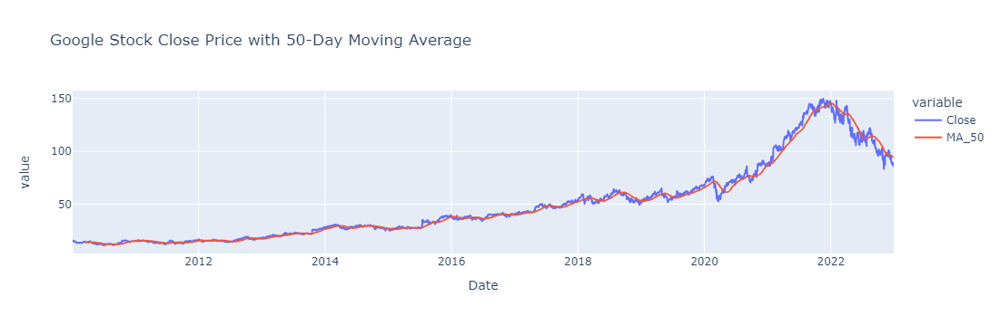

In [10]:
# Moving Average of closing prices
google_training_complete['MA_50'] = google_training_complete['Close'].rolling(window=50).mean()
fig7 = px.line(google_training_complete, x='Date', y=['Close', 'MA_50'], title='Google Stock Close Price with 50-Day Moving Average')
fig7.show()

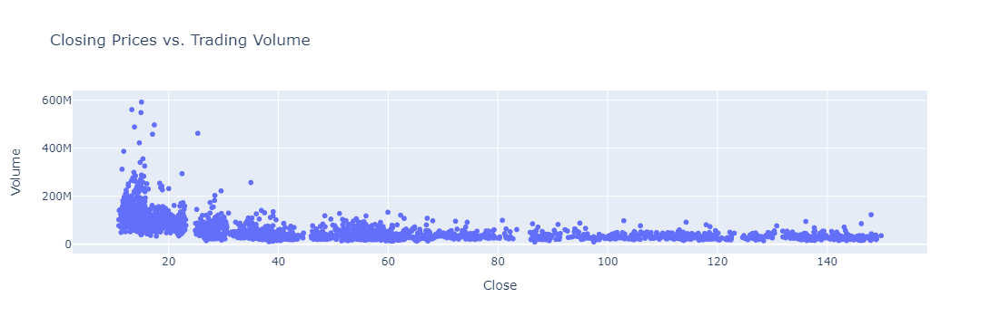

In [11]:
# Scatter plot of closing prices vs. trading volume
fig8 = px.scatter(google_training_complete, x='Close', y='Volume', title='Closing Prices vs. Trading Volume')
fig8.show()

/home/shane/.local/lib/python3.10/site-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



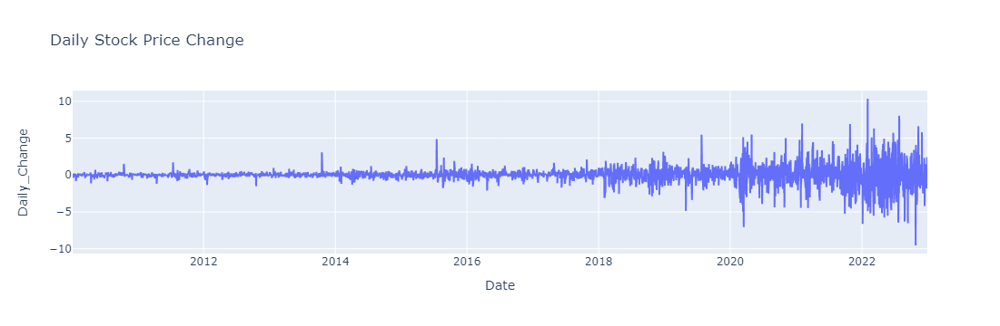

In [12]:
# Line chart for daily stock price change
google_training_complete['Daily_Change'] = google_training_complete['Close'].diff()
fig9 = px.line(google_training_complete, x='Date', y='Daily_Change', title='Daily Stock Price Change')
fig9.show()

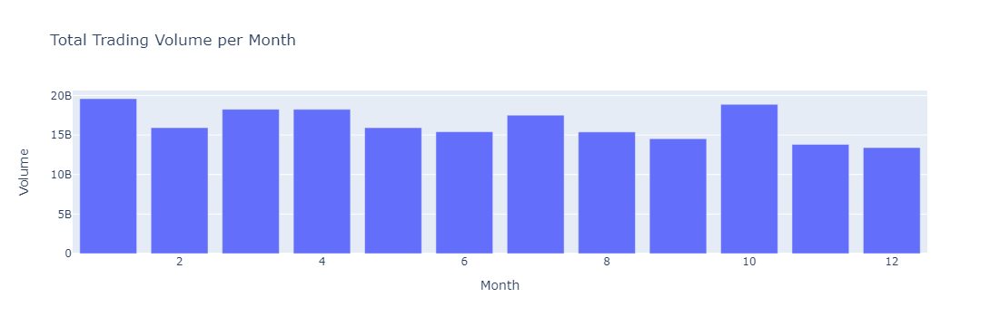

In [13]:
# Bar chart of trading volume per month
google_training_complete['Month'] = google_training_complete['Date'].dt.month
monthly_volume = google_training_complete.groupby('Month')['Volume'].sum().reset_index()
fig10 = px.bar(monthly_volume, x='Month', y='Volume', title='Total Trading Volume per Month')
fig10.show()

/home/shane/.local/lib/python3.10/site-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



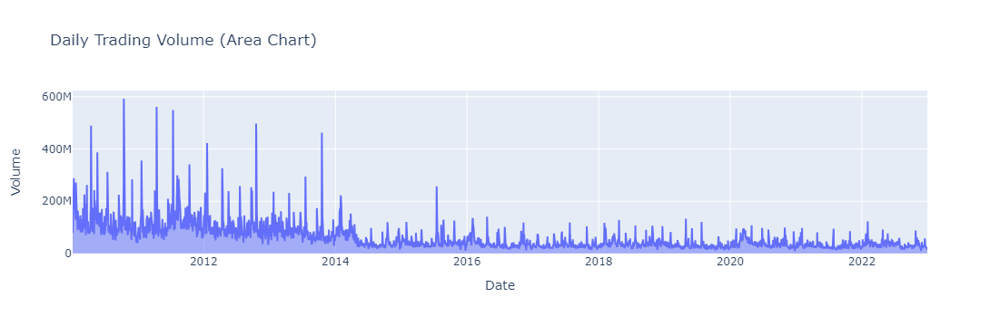

In [14]:
# Area chart for daily trading volume
fig11 = px.area(google_training_complete, x='Date', y='Volume', title='Daily Trading Volume (Area Chart)')
fig11.show()

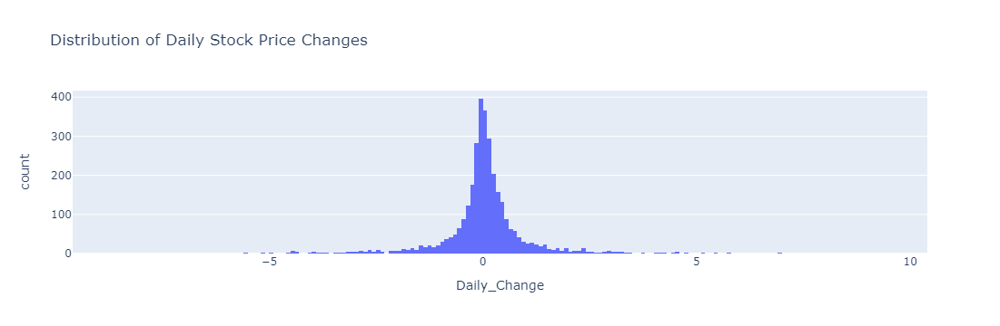

In [15]:
# Histogram of daily stock price fluctuations
fig12 = px.histogram(google_training_complete, x='Daily_Change', title='Distribution of Daily Stock Price Changes')
fig12.show()

/home/shane/.local/lib/python3.10/site-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



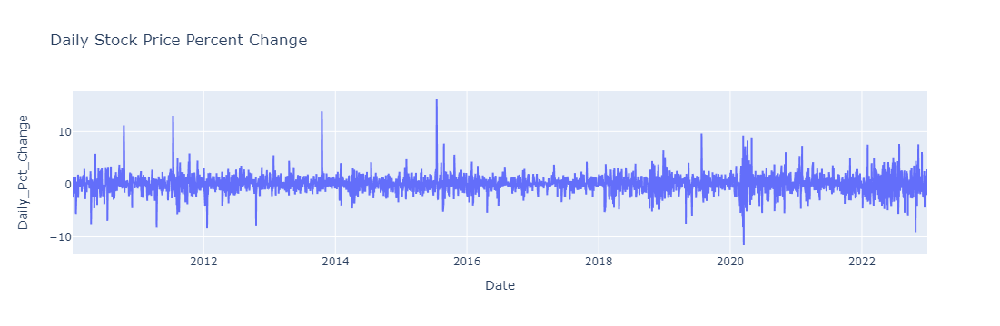

In [16]:
# Line chart for percent change of daily stock price
google_training_complete['Daily_Pct_Change'] = google_training_complete['Close'].pct_change() * 100
fig13 = px.line(google_training_complete, x='Date', y='Daily_Pct_Change', title='Daily Stock Price Percent Change')
fig13.show()

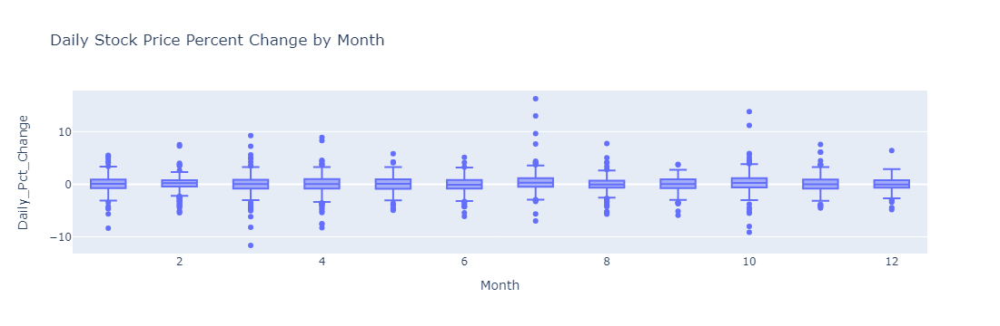

In [17]:
# Box plot of daily stock price percent change by month
fig14 = px.box(google_training_complete, x='Month', y='Daily_Pct_Change', title='Daily Stock Price Percent Change by Month')
fig14.show()

/home/shane/.local/lib/python3.10/site-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

/home/shane/.local/lib/python3.10/site-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



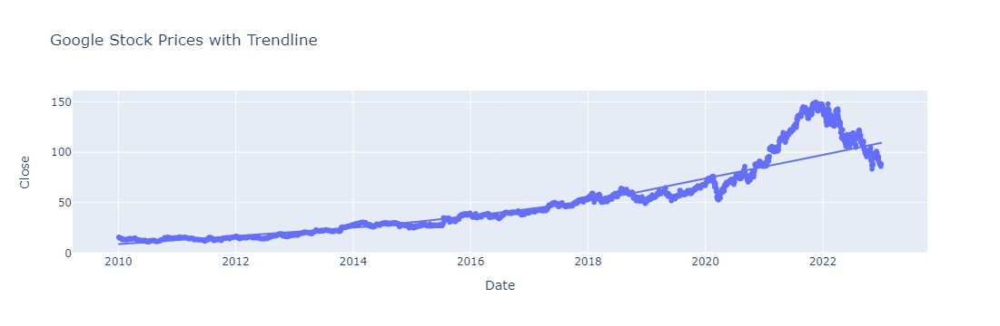

In [18]:
# Scatter plot of closing prices with Trend Line (should have used differnt color)
fig15 = px.scatter(google_training_complete, x='Date', y='Close', title='Google Stock Prices with Trendline', trendline='lowess')
fig15.show()

/home/shane/.local/lib/python3.10/site-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



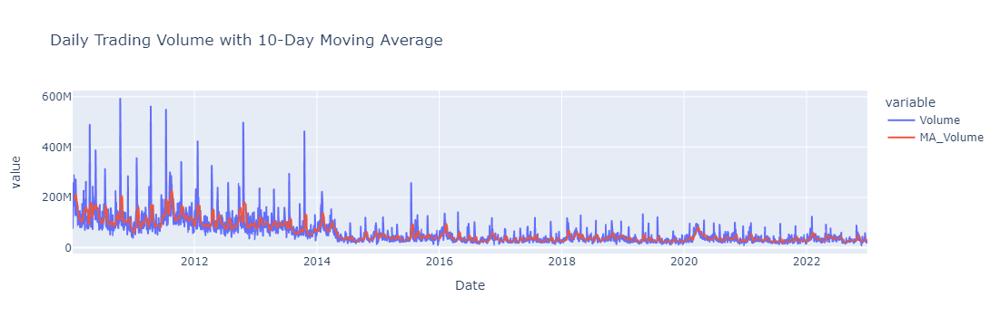

In [19]:
# Line chart for daily trading volume with moving average
google_training_complete['MA_Volume'] = google_training_complete['Volume'].rolling(window=10).mean()
fig16 = px.line(google_training_complete, x='Date', y=['Volume', 'MA_Volume'], title='Daily Trading Volume with 10-Day Moving Average')
fig16.show()

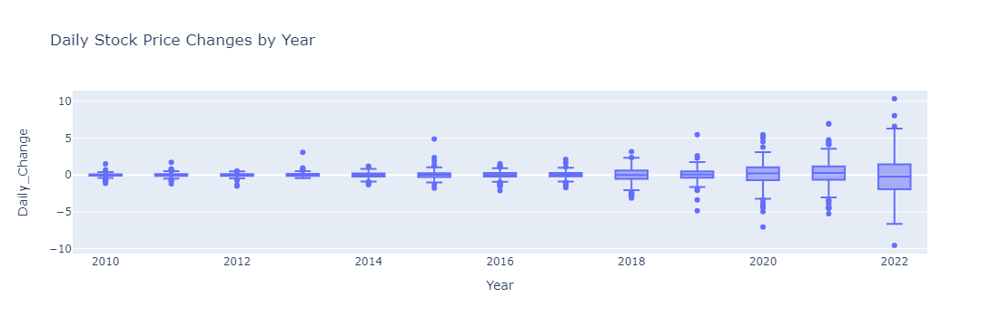

In [20]:
# Box plot of daily stock price changes by year 
google_training_complete['Year'] = google_training_complete['Date'].dt.year
fig17 = px.box(google_training_complete, x='Year', y='Daily_Change', title='Daily Stock Price Changes by Year')
fig17.show()

/home/shane/.local/lib/python3.10/site-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



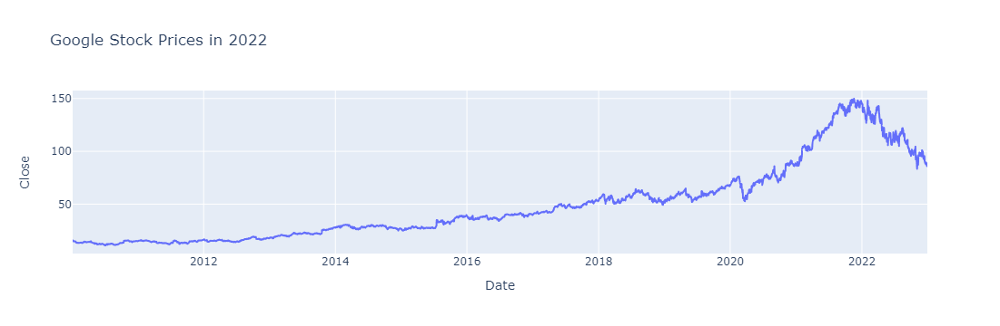

In [21]:
# Line chart for daily closing prices in 2022
# 2022 because Train dataset is 2010-2022
df_2022 = google_training_complete[google_training_complete['Year'] == 2022]
fig18 = px.line(google_training_complete, x='Date', y='Close', title='Google Stock Prices in 2022')
fig18.show()

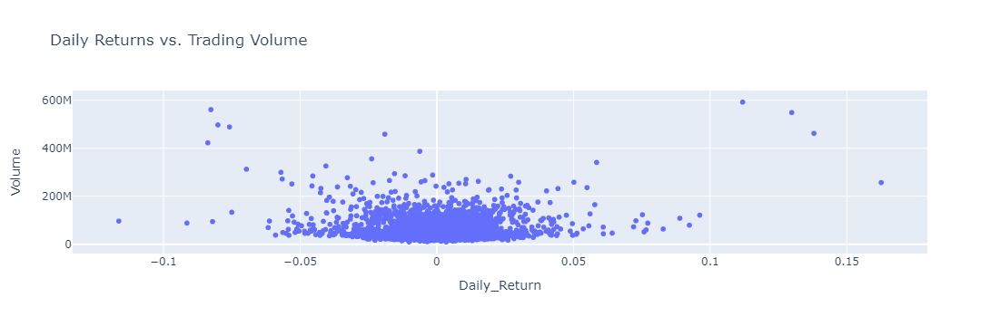

In [22]:
# Scatter plot of daily returns vs. trading volume
fig19 = px.scatter(google_training_complete, x='Daily_Return', y='Volume', title='Daily Returns vs. Trading Volume')
fig19.show()

/home/shane/.local/lib/python3.10/site-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



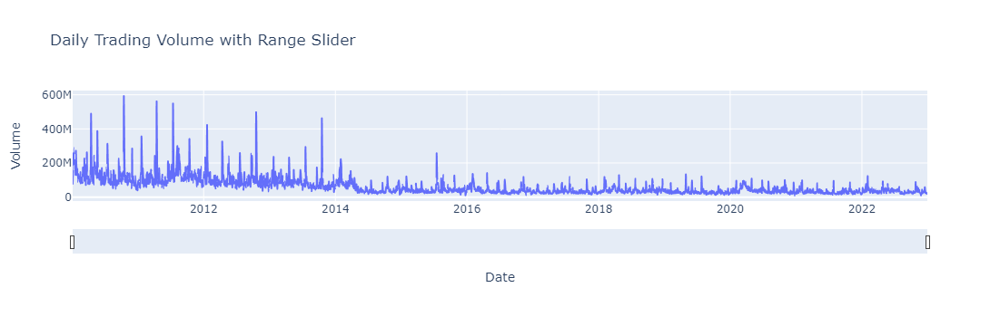

In [23]:
# Line chart for daily trading volume with range slider
fig20 = px.line(google_training_complete, x='Date', y='Volume', title='Daily Trading Volume with Range Slider')
fig20.update_xaxes(rangeslider_visible=True)
fig20.show()

## Data preprocessing

In [24]:
google_training_processed = google_training_complete.iloc[:, 4:5].values
google_training_processed

array([[15.684434],
       [15.615365],
       [15.221722],
       ...,
       [86.019997],
       [88.449997],
       [88.230003]])

In [25]:
scaler = MinMaxScaler(feature_range = (0, 1))

google_training_scaled = scaler.fit_transform(google_training_processed)

In [26]:
print(google_training_scaled)
print(google_training_scaled.shape)

[[0.03434761]
 [0.03385045]
 [0.03101697]
 ...
 [0.54062898]
 [0.55812033]
 [0.55653679]]
(3272, 1)


In [27]:
features_set = []
labels = []
for i in range(60, google_training_scaled.shape[0]):
    features_set.append(google_training_scaled[i-60:i, 0])
    labels.append(google_training_scaled[i, 0])

In [28]:
type(features_set)

list

In [29]:
features_set, labels = np.array(features_set), np.array(labels)

In [30]:
features_set = np.reshape(features_set, (features_set.shape[0], features_set.shape[1], 1))
print(features_set.shape)

(3212, 60, 1)


## LSTM layers work on 3D data with the following structure (nb_sequence, nb_timestep, nb_feature).

    - nb_sequence : total number of sequences in dataset
    - nb_timestep : size of sequences
    - nb_feature : number of features describing timesteps 


## RNN

#### Build RNN Model
##### Pretty generic/standard RNN

In [31]:
RNN_model = Sequential()
RNN_model.add(SimpleRNN(units=300, return_sequences=True, input_shape=(features_set.shape[1], 1)))
RNN_model.add(Dropout(0.2))

RNN_model.add(SimpleRNN(units=100, return_sequences=True))
RNN_model.add(Dropout(0.2))

RNN_model.add(SimpleRNN(units=100, return_sequences=True))
RNN_model.add(Dropout(0.2))

RNN_model.add(SimpleRNN(units=100))
RNN_model.add(Dropout(0.2))

RNN_model.add(Dense(units = 1))

2023-10-18 16:14:36.082137: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:880] could not open file to read NUMA node: /sys/bus/pci/devices/0000:43:00.0/numa_node
Your kernel may have been built without NUMA support.
2023-10-18 16:14:36.082241: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:880] could not open file to read NUMA node: /sys/bus/pci/devices/0000:43:00.0/numa_node
Your kernel may have been built without NUMA support.
2023-10-18 16:14:36.082271: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:880] could not open file to read NUMA node: /sys/bus/pci/devices/0000:43:00.0/numa_node
Your kernel may have been built without NUMA support.
2023-10-18 16:14:36.468842: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:880] could not open file to read NUMA node: /sys/bus/pci/devices/0000:43:00.0/numa_node
Your kernel may have been built without NUMA support.
2023-10-18 16:14:36.468912: I tensorflow/compile

##### Compile RNN Model using Adam optimizer

In [32]:
RNN_model.compile(optimizer = 'adam', loss = 'mean_squared_error')

In [33]:
RNN_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 simple_rnn (SimpleRNN)      (None, 60, 300)           90600     
                                                                 
 dropout (Dropout)           (None, 60, 300)           0         
                                                                 
 simple_rnn_1 (SimpleRNN)    (None, 60, 100)           40100     
                                                                 
 dropout_1 (Dropout)         (None, 60, 100)           0         
                                                                 
 simple_rnn_2 (SimpleRNN)    (None, 60, 100)           20100     
                                                                 
 dropout_2 (Dropout)         (None, 60, 100)           0         
                                                                 
 simple_rnn_3 (SimpleRNN)    (None, 100)               2

#### Fit RNN Model


In [40]:
# Finally got the GPU backend to work
# batch sizes of 32 led to a capped 24% GPU usage but raising it to 3200 made the GPU usage >50% and it proccessed the epochs lightning fast
RNN_History = RNN_model.fit(features_set, labels, epochs = 300, batch_size = 3200)

Epoch 1/300
2/2 [==============================] - 1s 353ms/step - loss: 0.0494
Epoch 2/300
2/2 [==============================] - 1s 348ms/step - loss: 0.0424
Epoch 3/300
2/2 [==============================] - 1s 353ms/step - loss: 0.0404
Epoch 4/300
2/2 [==============================] - 1s 382ms/step - loss: 0.0321
Epoch 5/300
2/2 [==============================] - 1s 398ms/step - loss: 0.0377
Epoch 6/300
2/2 [==============================] - 1s 389ms/step - loss: 0.0249
Epoch 7/300
2/2 [==============================] - 1s 397ms/step - loss: 0.0131
Epoch 8/300
2/2 [==============================] - 1s 356ms/step - loss: 0.0131
Epoch 9/300
2/2 [==============================] - 1s 361ms/step - loss: 0.0112
Epoch 10/300
2/2 [==============================] - 1s 351ms/step - loss: 0.0152
Epoch 11/300
2/2 [==============================] - 1s 349ms/step - loss: 0.0427
Epoch 12/300
2/2 [==============================] - 1s 337ms/step - loss: 0.0515
Epoch 13/300
2/2 [===================

#### The thing with RNNs are that they are limited by vanishing or exploding gradients. This is whey we can use LSTM and/or GRU

## LSTM

##### This works by passing info to the input gate, the output coming from the output gate, and the forget gate that trashes info we don't need. 

####  Build LSTM Model

In [41]:
LSTM_model = Sequential()
LSTM_model.add(LSTM(units=300, return_sequences=True, input_shape=(features_set.shape[1], 1)))
LSTM_model.add(Dropout(0.2))

LSTM_model.add(LSTM(units=100, return_sequences=True))
LSTM_model.add(Dropout(0.2))

LSTM_model.add(LSTM(units=100, return_sequences=True))
LSTM_model.add(Dropout(0.2))

LSTM_model.add(LSTM(units=100))
LSTM_model.add(Dropout(0.2))

LSTM_model.add(Dense(units = 1))

#### Compile LSTM Model using Adam Optimizer

In [42]:
LSTM_model.compile(optimizer = 'adam', loss = 'mean_squared_error')

In [43]:
LSTM_model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 60, 300)           362400    
                                                                 
 dropout_4 (Dropout)         (None, 60, 300)           0         
                                                                 
 lstm_1 (LSTM)               (None, 60, 100)           160400    
                                                                 
 dropout_5 (Dropout)         (None, 60, 100)           0         
                                                                 
 lstm_2 (LSTM)               (None, 60, 100)           80400     
                                                                 
 dropout_6 (Dropout)         (None, 60, 100)           0         
                                                                 
 lstm_3 (LSTM)               (None, 100)              

#### Fit LSTM Model

In [44]:
LSTM_History = LSTM_model.fit(features_set, labels, epochs = 300, batch_size = 3200)

Epoch 1/300
2/2 [==============================] - 5s 44ms/step - loss: 0.1446
Epoch 2/300
2/2 [==============================] - 0s 36ms/step - loss: 0.0072
Epoch 3/300
2/2 [==============================] - 0s 32ms/step - loss: 0.0060
Epoch 4/300
2/2 [==============================] - 0s 31ms/step - loss: 0.0517
Epoch 5/300
2/2 [==============================] - 0s 31ms/step - loss: 0.0714
Epoch 6/300
2/2 [==============================] - 0s 31ms/step - loss: 0.0684
Epoch 7/300
2/2 [==============================] - 0s 31ms/step - loss: 0.0553
Epoch 8/300
2/2 [==============================] - 0s 32ms/step - loss: 0.0322
Epoch 9/300
2/2 [==============================] - 0s 29ms/step - loss: 0.0137
Epoch 10/300
2/2 [==============================] - 0s 31ms/step - loss: 0.0319
Epoch 11/300
2/2 [==============================] - 0s 30ms/step - loss: 0.0149
Epoch 12/300
2/2 [==============================] - 0s 39ms/step - loss: 0.0085
Epoch 13/300
2/2 [==============================]

## GRU

##### Simplified version of LSTM: reset gate and update gate. The reset gate decides how much of the previous hidden state to keep, and the update gate decides how much new input to incorporate into the hidden state. It requires fewer parameters. 

####  Build GRU Model

In [45]:
GRU_model = Sequential()
GRU_model.add(GRU(units=300, return_sequences=True, input_shape=(features_set.shape[1], 1)))
GRU_model.add(Dropout(0.2))

GRU_model.add(GRU(units=100, return_sequences=True))
GRU_model.add(Dropout(0.2))

GRU_model.add(GRU(units=100, return_sequences=True))
GRU_model.add(Dropout(0.2))

GRU_model.add(GRU(units=100))
GRU_model.add(Dropout(0.2))

GRU_model.add(Dense(units = 1))

#### Compile GRU Model

In [46]:
GRU_model.compile(optimizer = 'adam', loss = 'mean_squared_error')

In [47]:
GRU_model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru (GRU)                   (None, 60, 300)           272700    
                                                                 
 dropout_8 (Dropout)         (None, 60, 300)           0         
                                                                 
 gru_1 (GRU)                 (None, 60, 100)           120600    
                                                                 
 dropout_9 (Dropout)         (None, 60, 100)           0         
                                                                 
 gru_2 (GRU)                 (None, 60, 100)           60600     
                                                                 
 dropout_10 (Dropout)        (None, 60, 100)           0         
                                                                 
 gru_3 (GRU)                 (None, 100)              

#### Fit GRU Model

In [49]:
GRU_History = GRU_model.fit(features_set, labels, epochs = 300, batch_size = 3200)

Epoch 1/300
2/2 [==============================] - 0s 29ms/step - loss: 0.0015
Epoch 2/300
2/2 [==============================] - 0s 28ms/step - loss: 9.1099e-04
Epoch 3/300
2/2 [==============================] - 0s 31ms/step - loss: 0.0013
Epoch 4/300
2/2 [==============================] - 0s 28ms/step - loss: 8.9488e-04
Epoch 5/300
2/2 [==============================] - 0s 25ms/step - loss: 0.0010
Epoch 6/300
2/2 [==============================] - 0s 25ms/step - loss: 9.8030e-04
Epoch 7/300
2/2 [==============================] - 0s 24ms/step - loss: 0.0016
Epoch 8/300
2/2 [==============================] - 0s 27ms/step - loss: 9.2135e-04
Epoch 9/300
2/2 [==============================] - 0s 30ms/step - loss: 0.0017
Epoch 10/300
2/2 [==============================] - 0s 26ms/step - loss: 0.0013
Epoch 11/300
2/2 [==============================] - 0s 27ms/step - loss: 0.0019
Epoch 12/300
2/2 [==============================] - 0s 29ms/step - loss: 0.0020
Epoch 13/300
2/2 [===============

## Evaluate The Model

#### Evaluate Model Training 

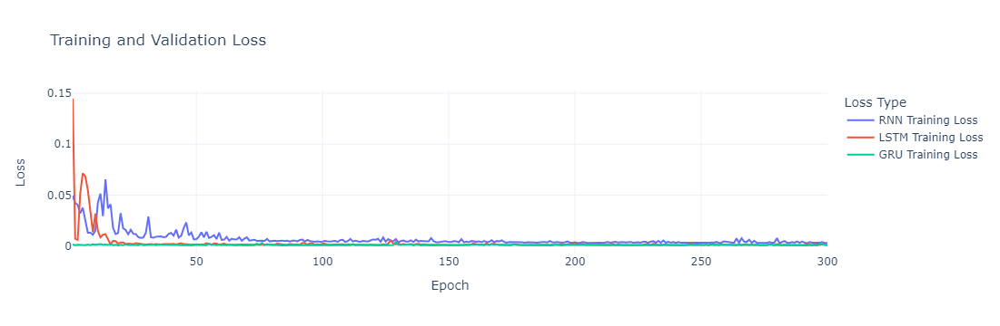

In [50]:
fig = go.Figure()

# Training loss trace
fig.add_trace(go.Scatter(x=list(range(1, len(RNN_History.history['loss']) + 1)), 
                         y=RNN_History.history['loss'],
                         mode='lines',
                         name='RNN Training Loss'))
fig.add_trace(go.Scatter(x=list(range(1, len(LSTM_History.history['loss']) + 1)), 
                         y=LSTM_History.history['loss'],
                         mode='lines',
                         name='LSTM Training Loss'))
fig.add_trace(go.Scatter(x=list(range(1, len(GRU_History.history['loss']) + 1)), 
                         y=GRU_History.history['loss'],
                         mode='lines',
                         name='GRU Training Loss'))

fig.update_layout(title='Training and Validation Loss',
                  xaxis_title='Epoch',
                  yaxis_title='Loss',
                  legend_title='Loss Type',
                  hovermode='x',
                  hoverlabel=dict(bgcolor='white', font_size=12, font_family='Rockwell'),
                  template='plotly_white')

fig.show()

#### Evaluate Model Prediction 

##### Using cleaned test dataset

In [57]:
google_testing_complete = pd.read_csv("./Google_Stock_Test (2023).csv")
google_testing_processed = google_testing_complete.iloc[:, 1:2].values

google_total = pd.concat((google_training_complete['Close'], google_testing_complete['Close']), axis=0)

test_inputs = google_total[len(google_total) - len(google_testing_complete) - 60:].values
test_inputs

array([101.419998,  98.68    ,  97.860001,  97.18    ,  97.559998,
        99.059998,  96.559998,  99.970001, 100.769997,  99.629997,
        99.970001, 101.129997, 102.519997, 104.480003,  94.93    ,
        92.220001,  96.290001,  94.510002,  90.470001,  86.970001,
        83.43    ,  86.580002,  88.489998,  88.900002,  87.32    ,
        93.940002,  96.410004,  95.699997,  98.440002,  98.849998,
        98.360001,  97.43    ,  95.599998,  97.050003,  98.459999,
        97.459999,  96.050003,  95.190002, 100.989998, 100.989998,
       100.440002,  99.480003,  96.980003,  94.940002,  93.709999,
        92.830002,  93.309998,  95.629997,  95.07    ,  90.860001,
        90.260002,  88.440002,  89.019997,  89.580002,  87.760002,
        89.230003,  87.389999,  86.019997,  88.449997,  88.230003,
        89.120003,  88.080002,  86.199997,  87.339996,  88.019997,
        88.419998,  91.519997,  91.129997,  92.120003,  91.290001,
        91.120003,  93.050003,  98.019997,  99.790001,  97.699

In [58]:
test_inputs = test_inputs.reshape(-1,1)
test_inputs = scaler.transform(test_inputs)

test_features = []
for i in range(60, len(test_inputs)):
    test_features.append(test_inputs[i-60:i, 0])
    
test_features = np.array(test_features)
test_features = np.reshape(test_features, (test_features.shape[0], test_features.shape[1], 1))
test_features.shape

(143, 60, 1)

In [59]:
# Test the model on the test set
## RNN
RNN_test_loss = RNN_model.evaluate(test_features, google_testing_processed)
print(f'RNN Test Loss: {RNN_test_loss}')

## LSTM
LSTM_test_loss = LSTM_model.evaluate(test_features, google_testing_processed)
print(f'LSTM Test Loss: {LSTM_test_loss}')

## GRU
GRU_test_loss = GRU_model.evaluate(test_features, google_testing_processed)
print(f'GRU Test Loss: {GRU_test_loss}')

5/5 [==============================] - 1s 66ms/step - loss: 11545.4990
RNN Test Loss: 11545.4990234375
5/5 [==============================] - 1s 16ms/step - loss: 11550.0293
LSTM Test Loss: 11550.029296875
5/5 [==============================] - 1s 18ms/step - loss: 11575.7695
LSTM Test Loss: 11575.76953125


## Forecast Markets

In [60]:
# RNN
RNN_predictions = RNN_model.predict(test_features)
RNN_predictions = scaler.inverse_transform(RNN_predictions)

# LSTM
LSTM_predictions = LSTM_model.predict(test_features)
LSTM_predictions = scaler.inverse_transform(LSTM_predictions)

# GRU
GRU_predictions = GRU_model.predict(test_features)
GRU_predictions = scaler.inverse_transform(GRU_predictions)

5/5 [==============================] - 1s 10ms/step


In [61]:
google_testing_complete

,Date,Open,High,Low,Close,Adj Close,Volume
0,2023-01-03,89.589996,91.050003,88.519997,89.120003,89.120003,28131200
1,2023-01-04,90.349998,90.650002,87.269997,88.080002,88.080002,34854800
2,2023-01-05,87.470001,87.570000,85.900002,86.199997,86.199997,27194400
3,2023-01-06,86.790001,87.690002,84.860001,87.339996,87.339996,41381500
4,2023-01-09,88.360001,90.050003,87.860001,88.019997,88.019997,29003900
...,...,...,...,...,...,...,...
138,2023-07-24,121.660004,123.000000,120.980003,121.529999,121.529999,29686100
139,2023-07-25,121.360001,123.150002,121.019997,122.209999,122.209999,52509600
140,2023-07-26,130.070007,130.979996,128.320007,129.270004,129.270004,61682100
141,2023-07-27,131.669998,133.240005,128.789993,129.399994,129.399994,44952100


In [62]:
google_prediction = google_testing_complete['Date']
google_prediction = pd.DataFrame(google_prediction)
google_prediction['RNN_Open'] = RNN_predictions
google_prediction['LSTM_Open'] = LSTM_predictions
google_prediction['GRU_Open'] = GRU_predictions

google_prediction

,Date,RNN_Open,LSTM_Open,GRU_Open
0,2023-01-03,89.519333,98.401093,78.831085
1,2023-01-04,89.489113,97.782120,79.041344
2,2023-01-05,89.636574,97.219818,79.156418
3,2023-01-06,89.770462,96.714958,78.887222
4,2023-01-09,89.799355,96.264481,78.604805
...,...,...,...,...
138,2023-07-24,136.945770,127.663452,108.560730
139,2023-07-25,136.781494,127.848602,108.264091
140,2023-07-26,136.534897,128.019958,108.350693
141,2023-07-27,136.514725,128.205750,109.546196


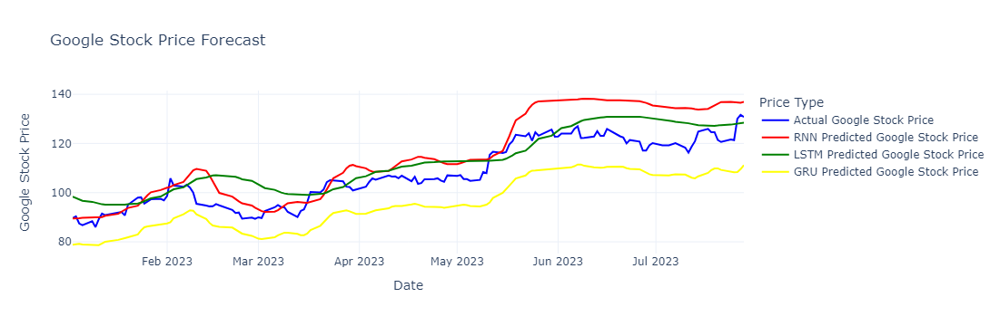

In [64]:
fig = go.Figure()

# Actual Google stock price trace
fig.add_trace(go.Scatter(x=google_testing_complete.Date,
                         y=google_testing_complete.Open,
                         mode='lines',
                         name='Actual Google Stock Price',
                         line=dict(color='blue')))

# RNN Google Apple stock price trace
fig.add_trace(go.Scatter(x=google_prediction.Date,
                         y=google_prediction.RNN_Open,
                         mode='lines',
                         name='RNN Predicted Google Stock Price',
                         line=dict(color='red')))

# LSTM Predicted Google stock price trace
fig.add_trace(go.Scatter(x=google_prediction.Date,
                         y=google_prediction.LSTM_Open,
                         mode='lines',
                         name='LSTM Predicted Google Stock Price',
                         line=dict(color='green')))

# LSTM Predicted Google stock price trace
fig.add_trace(go.Scatter(x=google_prediction.Date,
                         y=google_prediction.GRU_Open,
                         mode='lines',
                         name='GRU Predicted Google Stock Price',
                         line=dict(color='yellow')))

fig.update_layout(title='Google Stock Price Forecast',
                  xaxis_title='Date',
                  yaxis_title='Google Stock Price',
                  legend_title='Price Type',
                  hovermode='x',
                  hoverlabel=dict(bgcolor='white', font_size=12, font_family='Rockwell'),
                  template='plotly_white')

fig.show()